<a href="https://colab.research.google.com/github/shankch/reverse-image/blob/main/2_similarity_knn_cluster_plot.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#from google.colab import drive
#drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#!mkdir data
#!cp -a drive/MyDrive/c99t1/* data/ #copy saved models from gdrive folder to data directiory

In [ ]:
!pip3 install sklearn
!mkdir -p ../../datasets
!pip install gdown
!gdown http://weegee.vision.ucmerced.edu/datasets/UCMerced_LandUse.zip --output ../../datasets/UCMerced_LandUse.zip
!unzip ../../datasets/UCMerced_LandUse.zip -d ../../datasets/
!mv ../../datasets/UCMerced_LandUse/Images ../../datasets/udset

In [ ]:
import numpy as np
import pickle
from tqdm import tqdm, tqdm_notebook
import random
import time
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import PIL
from PIL import Image
from sklearn.neighbors import NearestNeighbors

import glob
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

# Similarity Search with Regular and FineTuned Models (try both and see the difference)

We write an indexer to index features and search for most similar features using various nearest neighbor algorithms, and explore various methods of visualizing plots.


Here we visualize some query images represented by their standard features with their nearest neighbors

In [ ]:
#Load regular model feature_list
reg_or_fine = 1 # 0 means regular model 1 means finetuned model  
filenames = pickle.load(open('./data/filenames-udset.pickle', 'rb'))
if not reg_or_fine:
  feature_list = pickle.load(open('data/features-udset-resnet.pickle','rb'))
else:
  feature_list = pickle.load(open('./data/features-udset-resnet-finetuned.pickle', 'rb'))
class_ids = pickle.load(open('./data/class_ids-udset.pickle', 'rb'))

In [ ]:
num_images = len(filenames)
num_features_per_image = len(feature_list[0])
print("Number of images = ", num_images)
print("Number of features per image = ", num_features_per_image)

Number of images =  2100
Number of features per image =  21


In [ ]:
neighbors = NearestNeighbors(n_neighbors=5,
                             algorithm='brute',
                             metric='euclidean').fit(feature_list)

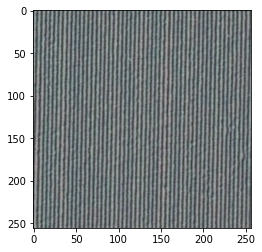

In [ ]:
random_index = 72
distances, indices = neighbors.kneighbors([feature_list[random_index]])
plt.imshow(mpimg.imread(filenames[72]), interpolation='lanczos')

[[72 57 68 73 51]]


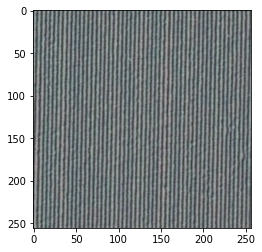

In [ ]:
print(indices)
plt.imshow(mpimg.imread(filenames[indices[0][0]]), interpolation='lanczos')

The nearest index will be the image itself because that is what is being queried.

In [ ]:
for i in range(5):
    print(distances[0][i])

0.0
6.143906e-08
7.146346e-08
9.541399e-08
1.4600097e-07


In [ ]:
# Helper function to get the classname
def classname(str):
    return str.split('/')[-2]


# Helper function to get the classname and filename
def classname_filename(str):
    return str.split('/')[-2] + '/' + str.split('/')[-1]


# Helper functions to plot the nearest images given a query image
def plot_images(filenames, distances):
    images = []
    for filename in filenames:
        images.append(mpimg.imread(filename))
    plt.figure(figsize=(20, 10))
    columns = 4
    for i, image in enumerate(images):
        ax = plt.subplot(len(images) / columns + 1, columns, i + 1)
        if i == 0:
            ax.set_title("Query Image\n" + classname_filename(filenames[i]))
        else:
            ax.set_title("Similar Image\n" + classname_filename(filenames[i]) +
                         "\nDistance: " +
                         str(float("{0:.2f}".format(distances[i]))))
        plt.imshow(image)
        # To save the plot in a high definition format i.e. PDF, uncomment the following line:
        #plt.savefig('results/' + str(random.randint(0,10000))+'.pdf', format='pdf', dpi=1000)

['../../datasets/udset/mediumresidential/mediumresidential74.tif', '../../datasets/udset/mediumresidential/mediumresidential45.tif', '../../datasets/udset/mediumresidential/mediumresidential38.tif', '../../datasets/udset/mediumresidential/mediumresidential51.tif']
['../../datasets/udset/harbor/harbor62.tif', '../../datasets/udset/harbor/harbor61.tif', '../../datasets/udset/harbor/harbor96.tif', '../../datasets/udset/harbor/harbor32.tif']
['../../datasets/udset/parkinglot/parkinglot22.tif', '../../datasets/udset/parkinglot/parkinglot37.tif', '../../datasets/udset/parkinglot/parkinglot44.tif', '../../datasets/udset/parkinglot/parkinglot96.tif']
['../../datasets/udset/beach/beach49.tif', '../../datasets/udset/beach/beach14.tif', '../../datasets/udset/beach/beach55.tif', '../../datasets/udset/beach/beach22.tif']
['../../datasets/udset/parkinglot/parkinglot19.tif', '../../datasets/udset/parkinglot/parkinglot35.tif', '../../datasets/udset/parkinglot/parkinglot74.tif', '../../datasets/udset/p

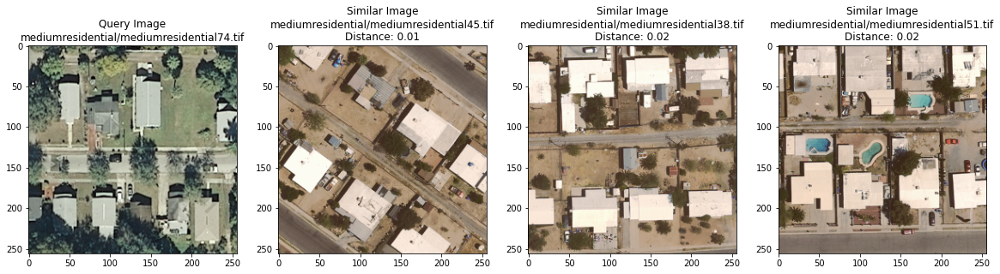

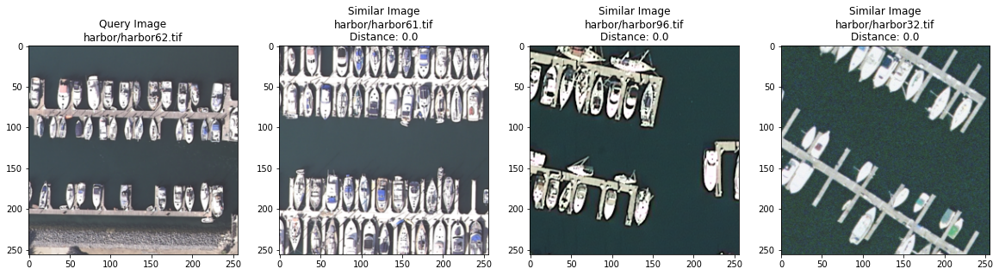

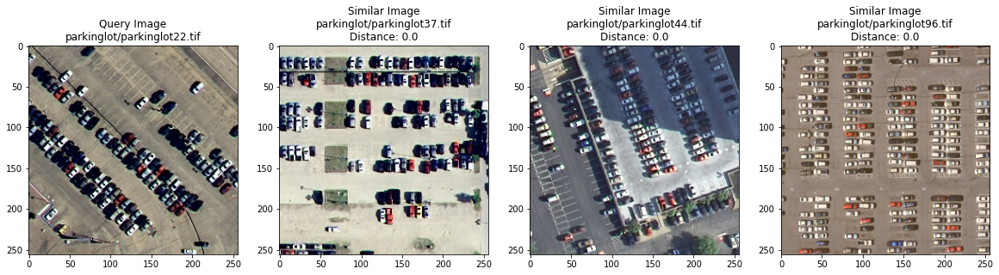

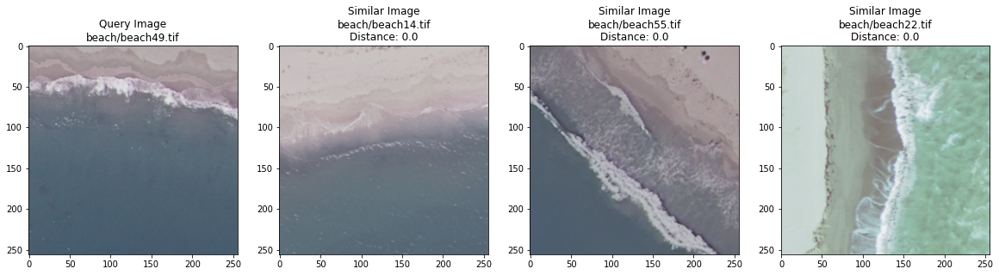

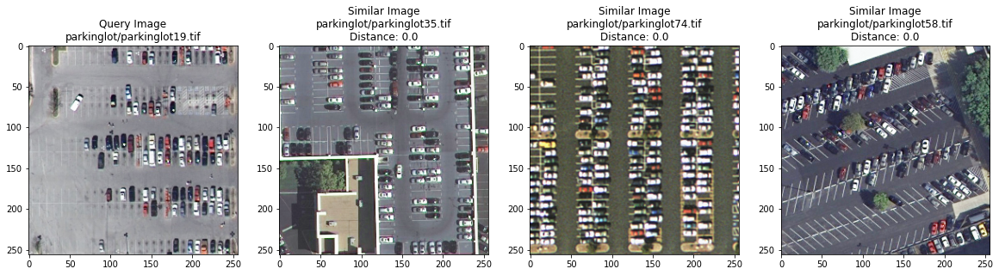

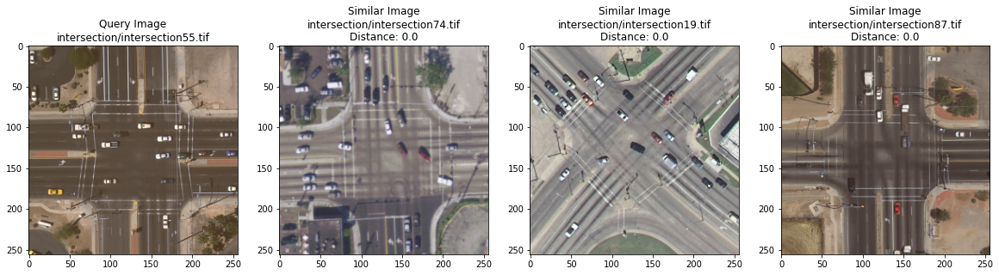

In [ ]:
for i in range(6):
    random_image_index = random.randint(0, num_images)
    distances, indices = neighbors.kneighbors(
        [feature_list[random_image_index]])
    # Don't take the first closest image as it will be the same image
    similar_image_paths = [filenames[random_image_index]] + [filenames[indices[0][i]] for i in range(1, 4)]
    print(similar_image_paths)
    plot_images(similar_image_paths, distances[0])

In [ ]:
neighbors = NearestNeighbors(n_neighbors=len(feature_list),
                             algorithm='brute',
                             metric='euclidean').fit(feature_list)
distances, indices = neighbors.kneighbors(feature_list)

# Calculating some stats
print (distances[:])
print(indices)
print("Median distance between all photos: ", np.median(distances))
print("Max distance between all photos: ", np.max(distances))


[[0.0000000e+00 1.6955124e-01 1.8857810e-01 ... 1.4142119e+00
  1.4142121e+00 1.4142123e+00]
 [0.0000000e+00 6.4958808e-06 6.7514757e-06 ... 1.4142135e+00
  1.4142135e+00 1.4142135e+00]
 [0.0000000e+00 9.8025578e-04 1.2498859e-03 ... 1.4142135e+00
  1.4142135e+00 1.4142135e+00]
 ...
 [0.0000000e+00 3.0862886e-01 4.4485477e-01 ... 1.4134839e+00
  1.4134839e+00 1.4134839e+00]
 [0.0000000e+00 2.5250280e-02 2.5408512e-02 ... 1.4142112e+00
  1.4142112e+00 1.4142112e+00]
 [0.0000000e+00 6.1604064e-03 8.3230147e-03 ... 1.4142134e+00
  1.4142134e+00 1.4142134e+00]]
[[   0   32   33 ... 1243 1299 1217]
 [   1   91   86 ...  284  278 1996]
 [   2   61    4 ...  245  269 1970]
 ...
 [2097 1195 2049 ...  750  777  749]
 [2098 2000 2056 ... 1527 1547 1598]
 [2099 2035 2086 ... 1547 1540 1598]]
Median distance between all photos:  1.4141849
Max distance between all photos:  1.4142137


In [ ]:
print("Median distance among most similar photos: ",
      np.median(distances))

Median distance among most similar photos:  1.4141849


In [ ]:
selected_features = feature_list[:]
selected_class_ids = class_ids[:]
selected_filenames = filenames[:]

In [ ]:
n_components = 2
verbose = 1
perplexity = 30
n_iter = 1000
metric = 'euclidean'

time_start = time.time()
tsne_results = TSNE(n_components=n_components,
                    verbose=verbose,
                    perplexity=perplexity,
                    n_iter=n_iter,
                    metric=metric).fit_transform(selected_features)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time() - time_start))

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2100 samples in 0.008s...
[t-SNE] Computed neighbors for 2100 samples in 0.195s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2100
[t-SNE] Computed conditional probabilities for sample 2000 / 2100
[t-SNE] Computed conditional probabilities for sample 2100 / 2100
[t-SNE] Mean sigma: 0.000001
[t-SNE] KL divergence after 250 iterations with early exaggeration: 46.661606
[t-SNE] KL divergence after 1000 iterations: 0.204498
t-SNE done! Time elapsed: 12.775093078613281 seconds


Plot a scatter plot from the generated t-SNE results

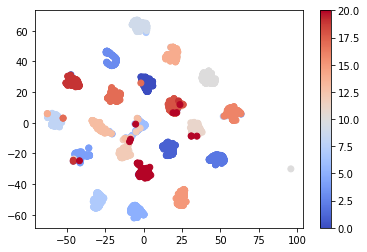

In [ ]:
color_map = plt.cm.get_cmap('coolwarm')
scatter_plot = plt.scatter(tsne_results[:, 0],
                           tsne_results[:, 1],
                           c=selected_class_ids,
                           cmap=color_map)
plt.colorbar(scatter_plot)
plt.show()
# To save the plot in a high definition format i.e. PDF, uncomment the following line:
#plt.savefig('results/' + str(ADD_NAME_HERE)+'.pdf', format='pdf', dpi=1000)

Now we write a helper function to plot images in 2D for t-SNE.

In [ ]:
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib.cbook import get_sample_data

def plot_images_in_2d(x, y, image_paths, axis=None, zoom=1):
    if axis is None:
        axis = plt.gca()
    x, y = np.atleast_1d(x, y)
    for x0, y0, image_path in zip(x, y, image_paths):
        image = Image.open(image_path)
        image.thumbnail((100, 100), Image.ANTIALIAS)
        img = OffsetImage(image, zoom=zoom)
        anno_box = AnnotationBbox(img, (x0, y0),
                                  xycoords='data',
                                  frameon=False)
        axis.add_artist(anno_box)
    axis.update_datalim(np.column_stack([x, y]))
    axis.autoscale()

In [ ]:
def show_tsne(x, y, selected_filenames):
    fig, axis = plt.subplots()
    fig.set_size_inches(22, 22, forward=True)
    plot_images_in_2d(x, y, selected_filenames, zoom=0.3, axis=axis)
    plt.show()

Visualize the patterns in the images using t-SNE

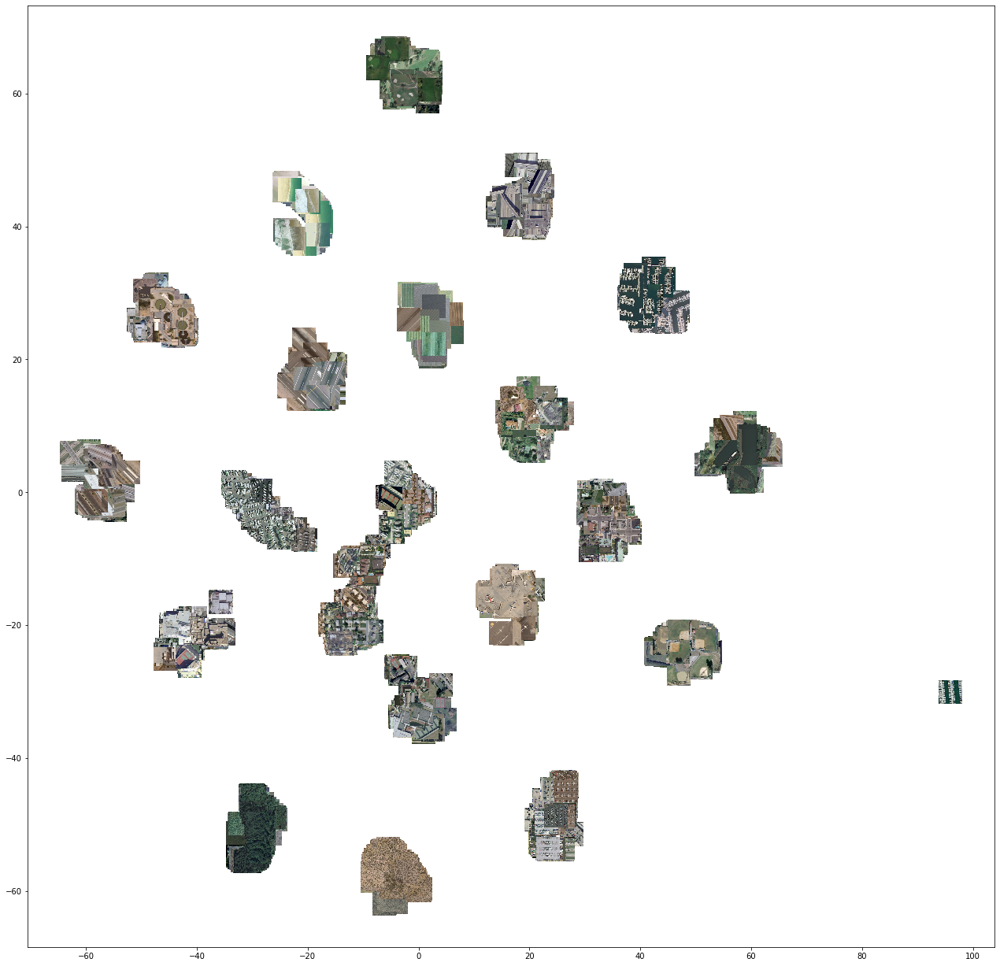

In [ ]:
show_tsne(tsne_results[:, 0], tsne_results[:, 1], selected_filenames)

In [ ]:
def tsne_to_grid_plotter_manual(x, y, selected_filenames):
    S = 2000
    s = 100
    x = (x - min(x)) / (max(x) - min(x))
    y = (y - min(y)) / (max(y) - min(y))
    x_values = []
    y_values = []
    filename_plot = []
    x_y_dict = {}
    for i, image_path in enumerate(selected_filenames):
        a = np.ceil(x[i] * (S - s))
        b = np.ceil(y[i] * (S - s))
        a = int(a - np.mod(a, s))
        b = int(b - np.mod(b, s))
        if str(a) + "|" + str(b) in x_y_dict:
            continue
        x_y_dict[str(a) + "|" + str(b)] = 1
        x_values.append(a)
        y_values.append(b)
        filename_plot.append(image_path)
    fig, axis = plt.subplots()
    fig.set_size_inches(22, 22, forward=True)
    plot_images_in_2d(x_values, y_values, filename_plot, zoom=.58, axis=axis)
    plt.show()

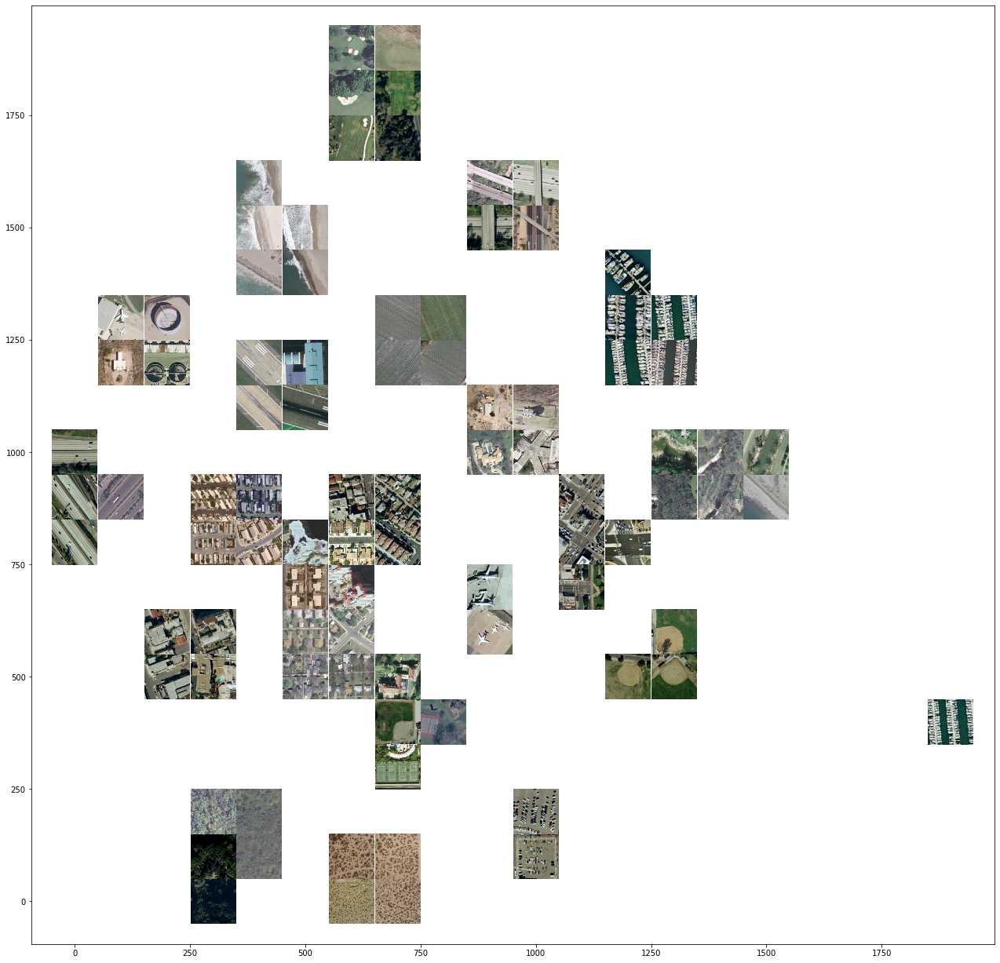

In [ ]:
tsne_to_grid_plotter_manual(tsne_results[:, 0], tsne_results[:, 1], selected_filenames)

### PCA

We will perform [Principal Component Analysis (PCA)](https://asaip.psu.edu/submitted-papers/2013/liii.-on-lines-and-planes-of-closest-fit-to-systems-of-points-in-space) over the features using `100` feature dimensions for regular model and 15 for the finetuned model.


In [ ]:
num_feature_dimensions = 15 # modify to less than 21 in case of finetuned as max 21 features in case of finetuned model
pca = PCA(n_components=num_feature_dimensions)
pca.fit(feature_list)
feature_list_compressed = pca.transform(feature_list)

In [ ]:
neighbors = NearestNeighbors(n_neighbors=5,
                             algorithm='brute',
                             metric='euclidean').fit(feature_list_compressed)
distances, indices = neighbors.kneighbors([feature_list_compressed[0]])

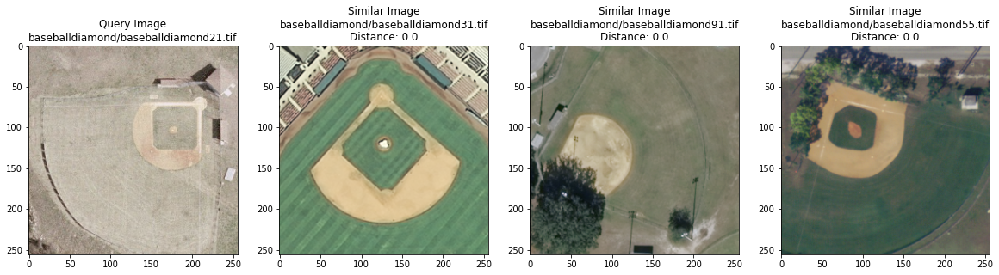

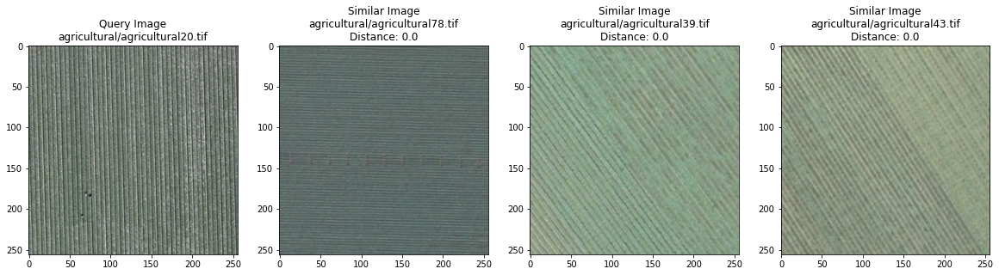

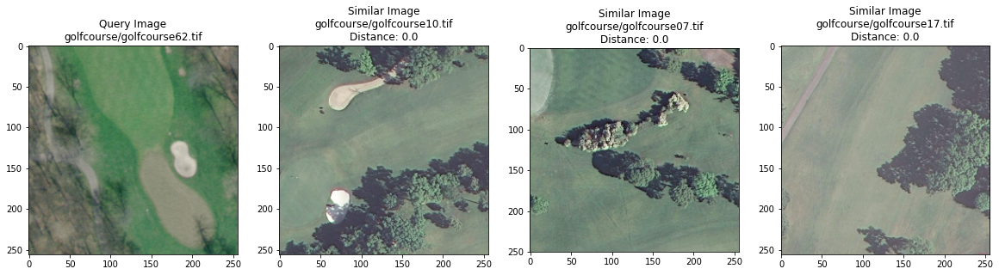

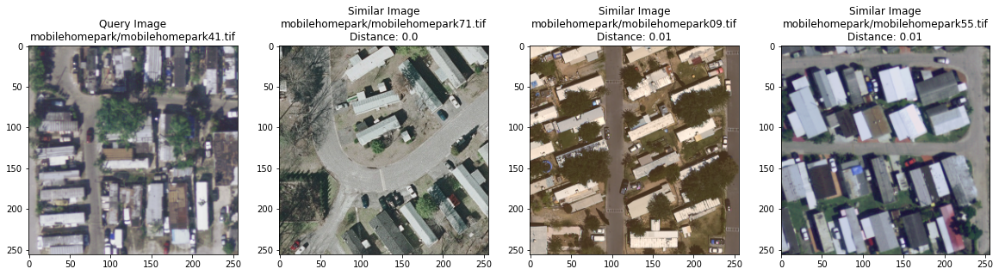

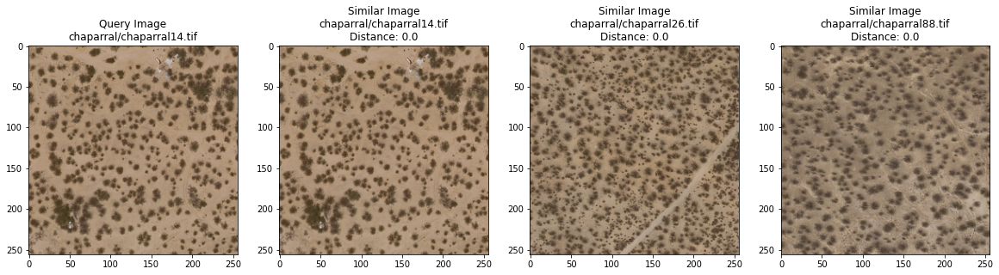

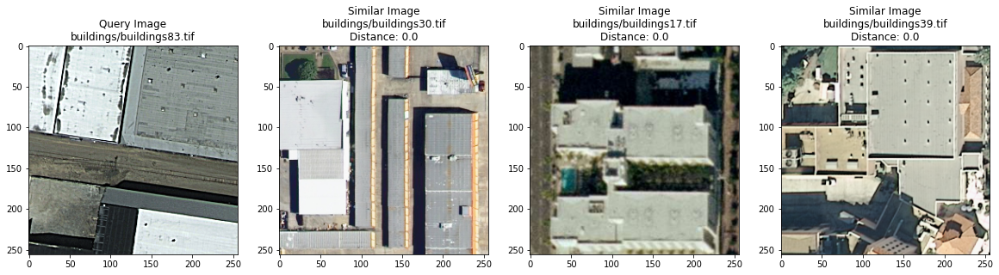

In [ ]:
#Visualize some query images with their nearest neighbors
for i in range(6):
    random_image_index = random.randint(0, num_images)
    distances, indices = neighbors.kneighbors(
        [feature_list_compressed[random_image_index]])
    # Don't take the first closest image as it will be the same image
    similar_image_paths = [filenames[random_image_index]] + \
        [filenames[indices[0][i]] for i in range(1, 4)]
    plot_images(similar_image_paths, distances[0])

Again, for speed we pick a few thousand image samples.

In [ ]:
selected_features = feature_list_compressed[:4000]
selected_class_ids = class_ids[:4000]
selected_filenames = filenames[:4000]

time_start = time.time()
tsne_results = TSNE(n_components=2, verbose=1, metric='euclidean').fit_transform(selected_features)
print('t-SNE done! Time elapsed: {} seconds'.format(time.time() - time_start))

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2100 samples in 0.006s...
[t-SNE] Computed neighbors for 2100 samples in 0.100s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2100
[t-SNE] Computed conditional probabilities for sample 2000 / 2100
[t-SNE] Computed conditional probabilities for sample 2100 / 2100
[t-SNE] Mean sigma: 0.000001
[t-SNE] KL divergence after 250 iterations with early exaggeration: 46.483101
[t-SNE] KL divergence after 1000 iterations: 0.192568
t-SNE done! Time elapsed: 12.201159715652466 seconds


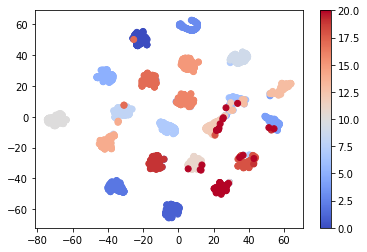

In [ ]:
# Plot a scatter plot from the generated t-SNE results
color_map = plt.cm.get_cmap('coolwarm')
scatter_plot = plt.scatter(tsne_results[:, 0],
                           tsne_results[:, 1],
                           c=selected_class_ids,
                           cmap=color_map)
plt.colorbar(scatter_plot)
plt.show()

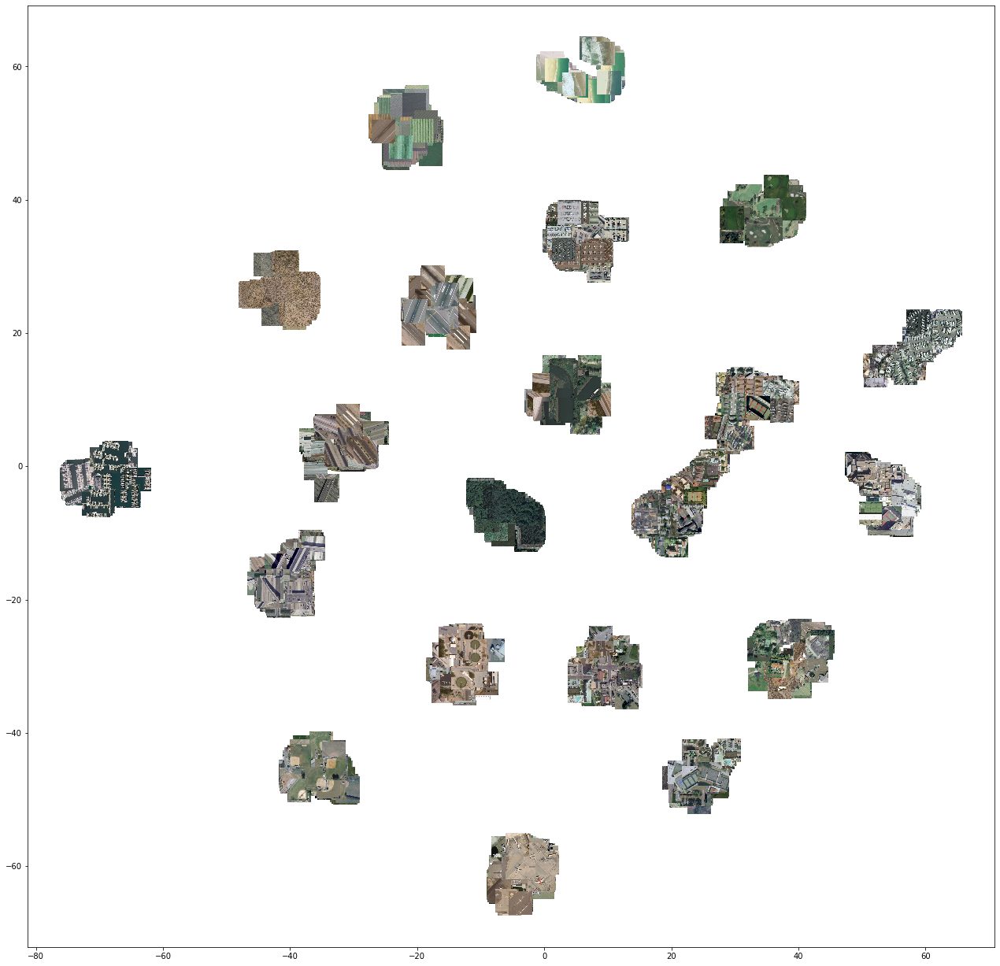

In [ ]:
# Visualize the patterns in the images using t-SNE
show_tsne(tsne_results[:, 0], tsne_results[:, 1], selected_filenames)


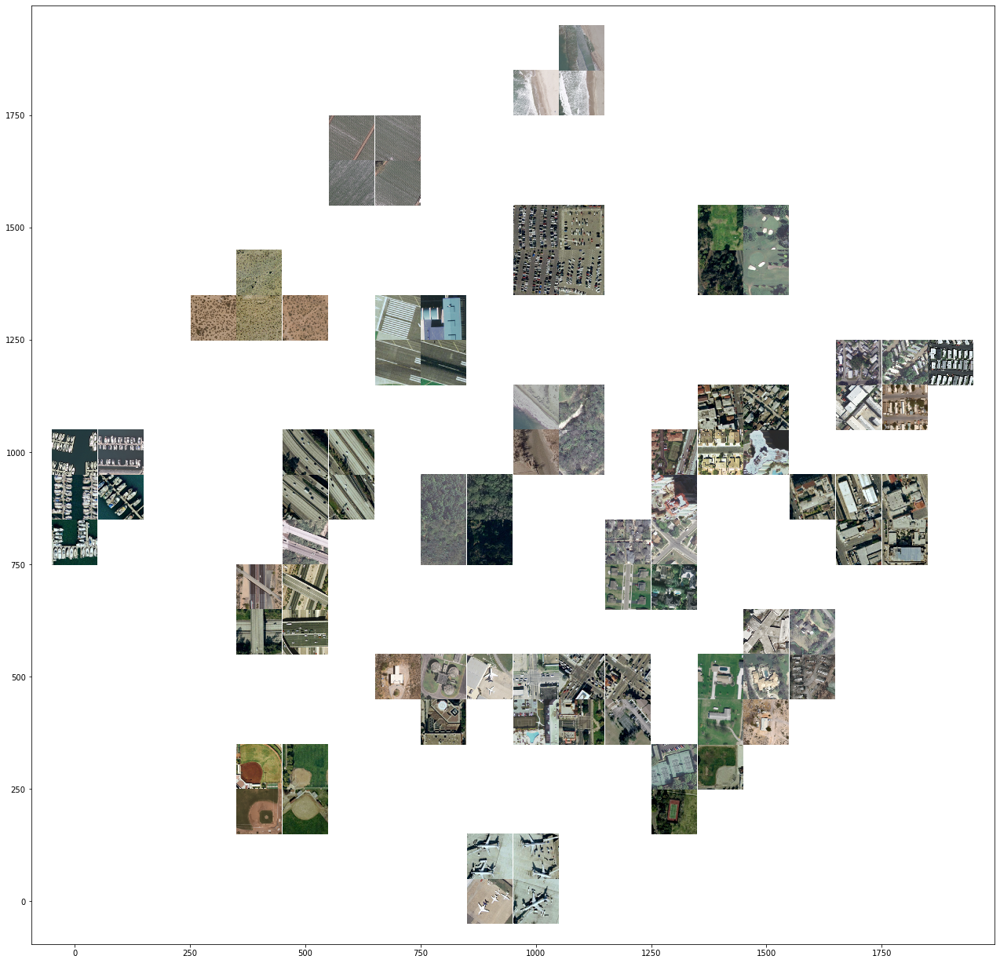

In [ ]:
tsne_to_grid_plotter_manual(tsne_results[:, 0], tsne_results[:, 1], selected_filenames)